In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def twobit_to_dna(twobit: int, size: int) -> str:
/home/kko1/.pyenv/versions/3.8.19/lib/python3.8/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def dna_to_twobit(dna: str) -> int:
/home/kko1/.pyen

Running scvelo 0.3.2 (python 3.8.19) on 2024-11-17 02:24.


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI no longer supports 'pip search' (or XML-RPC search). Please use https://pypi.org/search (via a browser) instead. See https://warehouse.pypa.io/api-reference/xml-rpc.html#deprecated-methods for more information.


scanpy==1.9.8 anndata==0.9.2 umap==0.5.6 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1 pynndescent==0.5.13


In [ ]:
import os
os.chdir('D:/KP/EKP_RKP')

In [ ]:
import scanpy.external as sce

In [109]:
adata = sc.read('adata_sliced_and_copied.h5ad')

In [110]:
adata

AnnData object with n_obs × n_vars = 1832 × 16482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [111]:
adata = adata[adata.obs['type']=='EKP']
adata

View of AnnData object with n_obs × n_vars = 717 × 16482
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [112]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000, enforce=True)
scv.pp.log1p(adata)
adata

Filtered out 9127 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [113]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=10)
adata

computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'leiden_colors', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


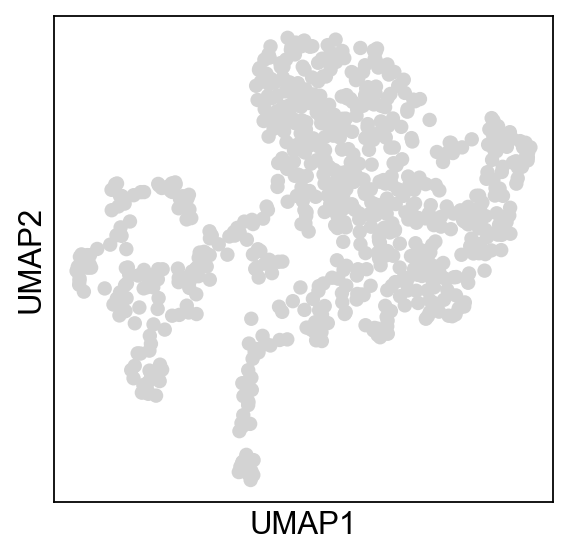

In [114]:
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.pl.umap(adata)

In [115]:
scv.tl.recover_dynamics(adata, n_jobs=16)
scv.tl.velocity(adata, mode='dynamical', use_raw=False)
scv.tl.velocity_graph(adata, n_jobs=16)
adata

recovering dynamics (using 16/16 cores)


  0%|          | 0/540 [00:00<?, ?gene/s]

    finished (0:00:22) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 16/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'leiden_colors', 'neighbors', 'umap', 'leiden

In [118]:
#scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
#adata

In [119]:
#############################################################
############ Harmony batch correction #######################
#############################################################

sce.pp.harmony_integrate(adata, 'batch')
'X_pca_harmony' in adata.obsm
True

2024-07-25 11:12:42,009 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-07-25 11:12:42,156 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-07-25 11:12:42,156 - harmonypy - INFO - Iteration 1 of 10
2024-07-25 11:12:42,249 - harmonypy - INFO - Iteration 2 of 10
2024-07-25 11:12:42,305 - harmonypy - INFO - Iteration 3 of 10
2024-07-25 11:12:42,380 - harmonypy - INFO - Iteration 4 of 10
2024-07-25 11:12:42,449 - harmonypy - INFO - Iteration 5 of 10
2024-07-25 11:12:42,489 - harmonypy - INFO - Iteration 6 of 10
2024-07-25 11:12:42,505 - harmonypy - INFO - Converged after 6 iterations


True

In [120]:
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)
sc.tl.umap(adata)


computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


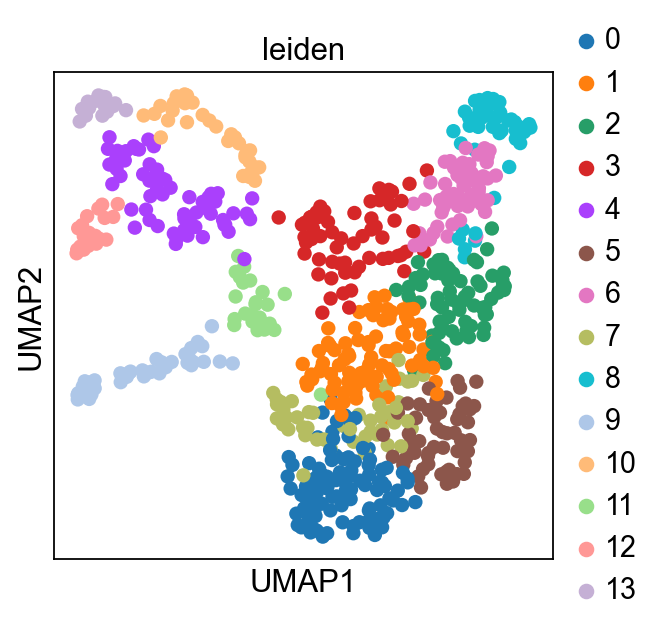

In [121]:
sc.pl.umap(adata, color=['leiden'])

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


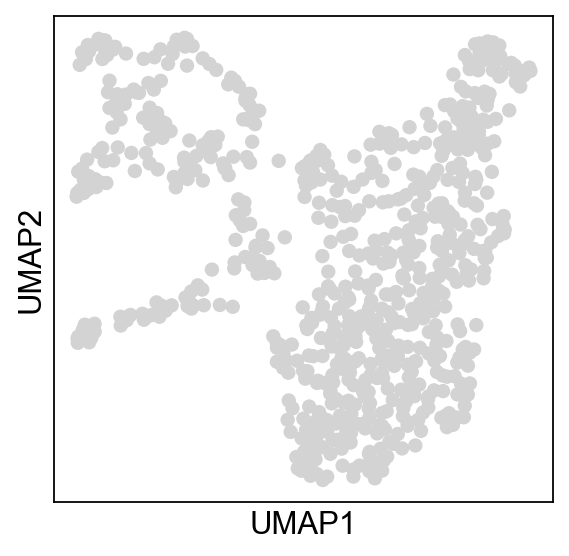

In [122]:
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata)

In [123]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=15)
adata

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velocity_genes'
    uns: 'leiden_colors', 'neighbors', 'umap', 'leiden

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


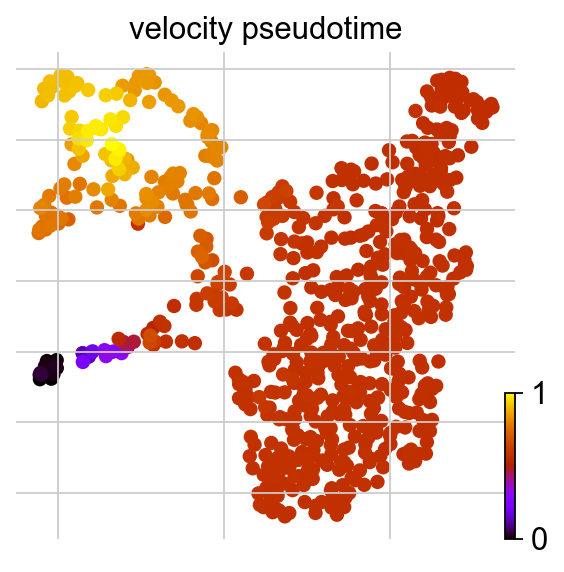

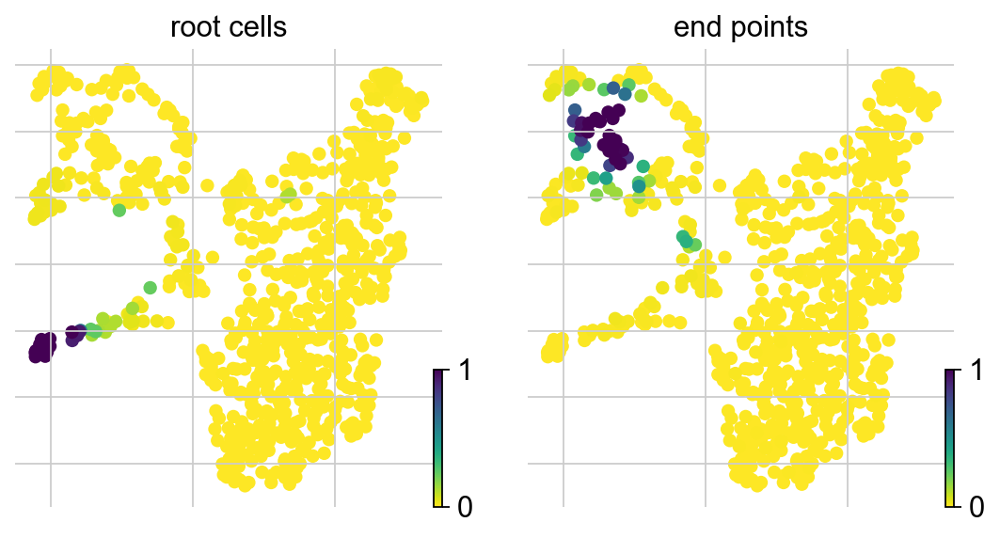

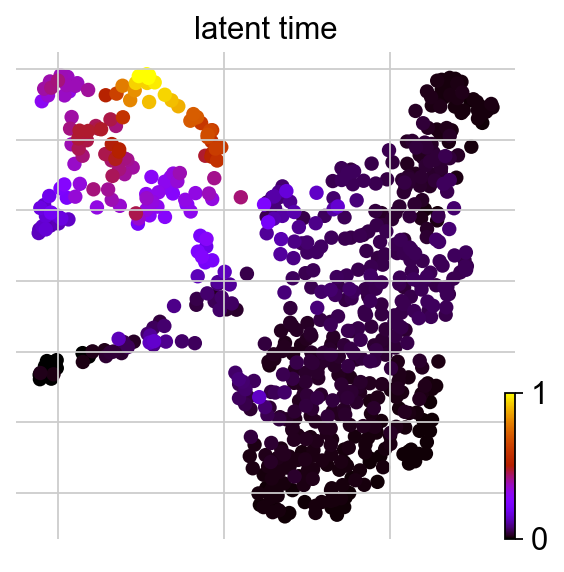

In [124]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=15, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


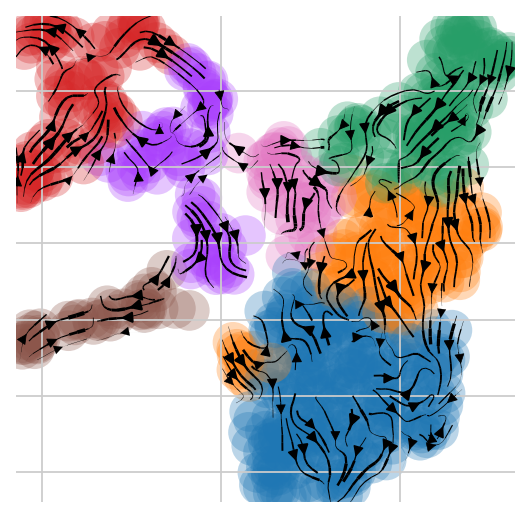

In [125]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [126]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=25)
adata

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velo

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


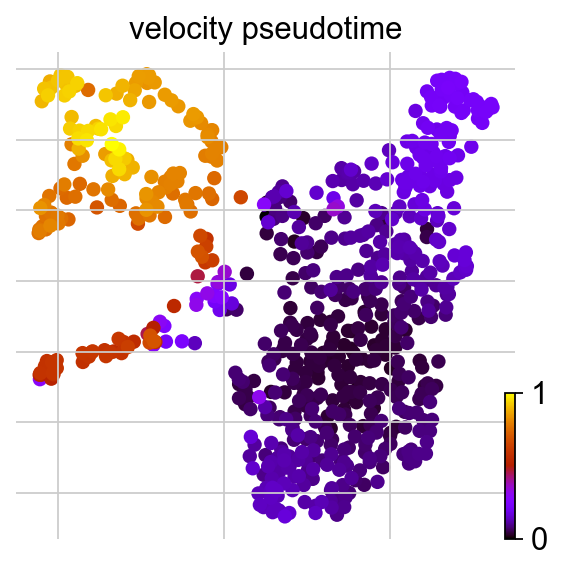

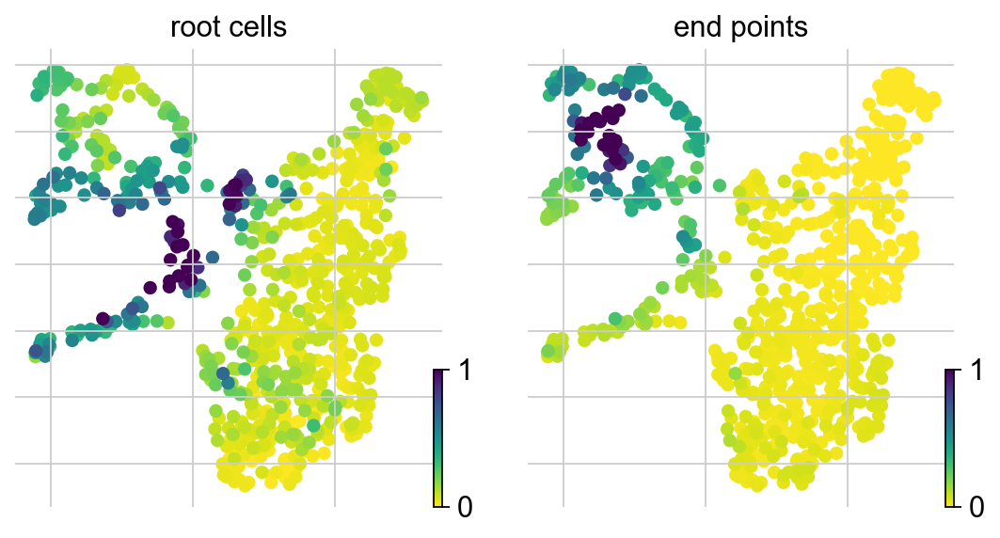

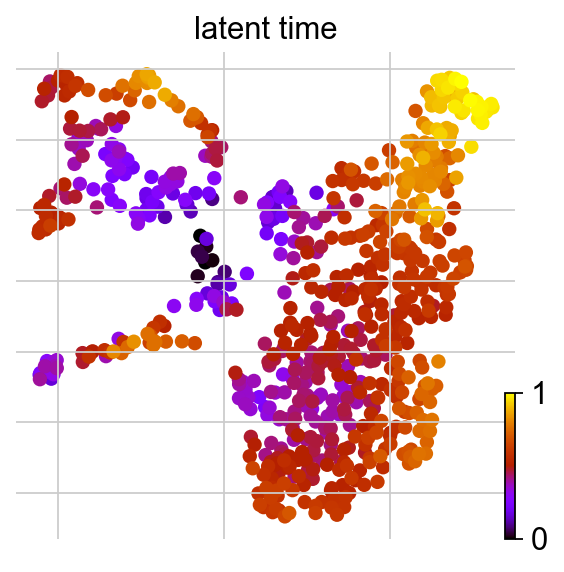

In [127]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=25, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


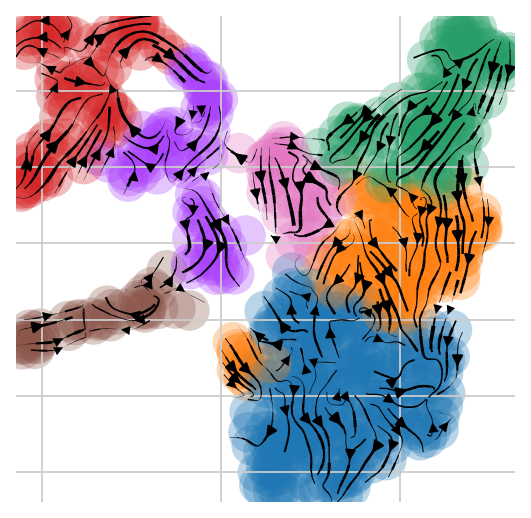

In [128]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [129]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=30)
adata

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velo

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


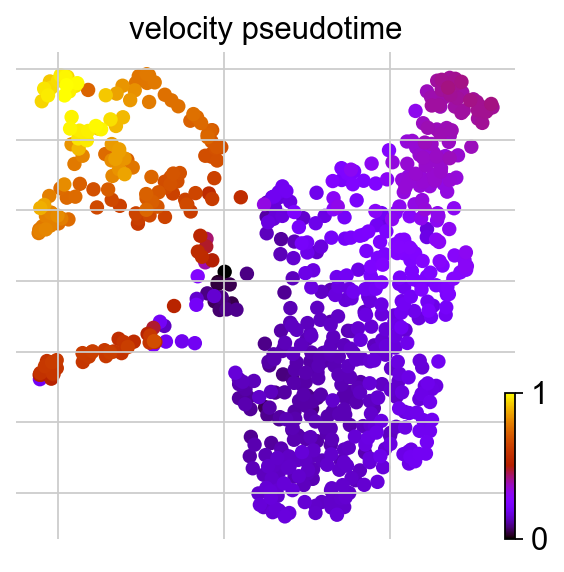

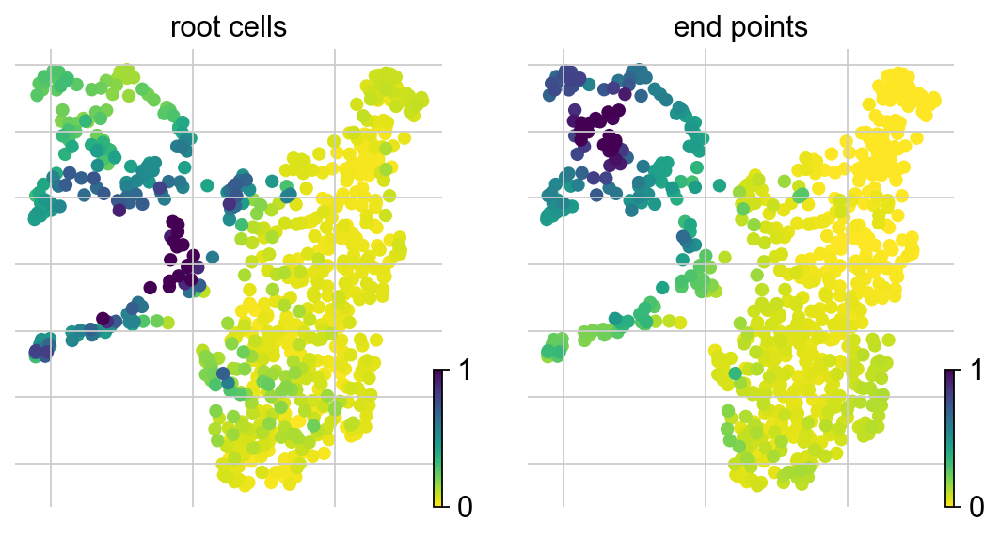

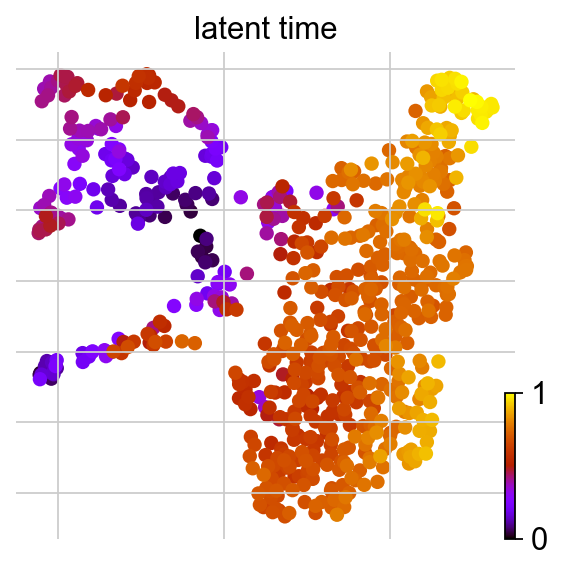

In [130]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=30, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


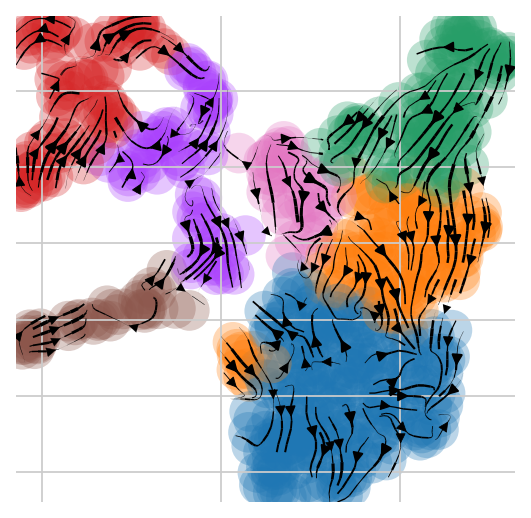

In [131]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [132]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=5)
adata

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velo

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 5 regions of root cells and 4 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


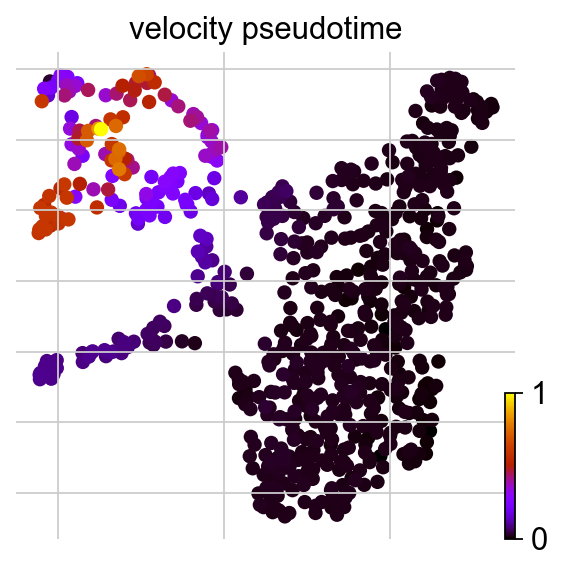

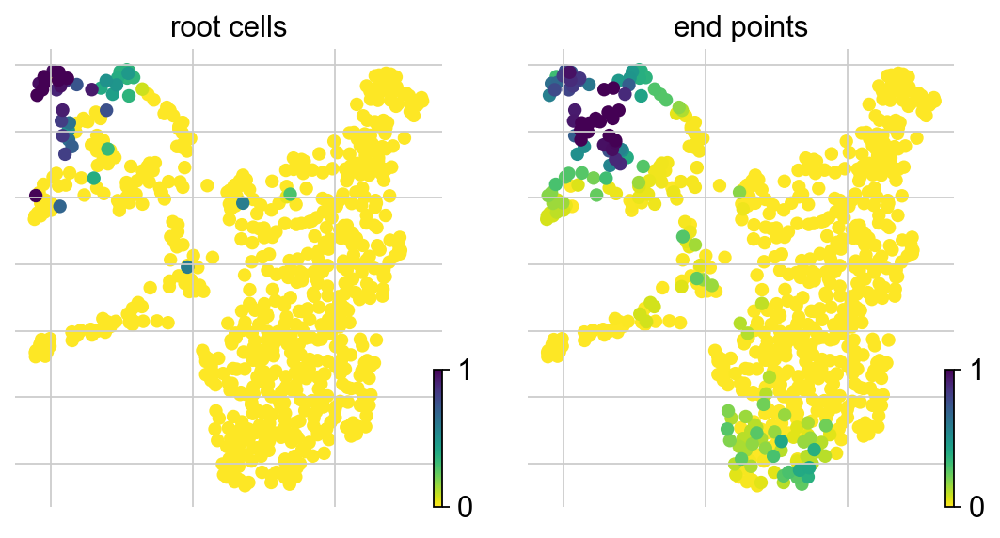

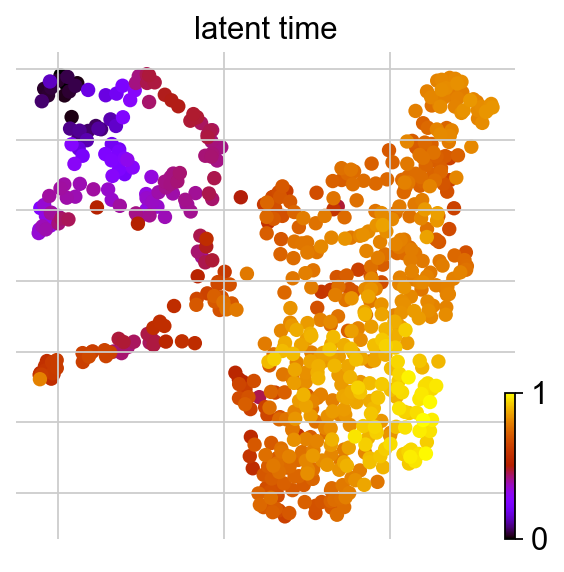

In [133]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=5, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


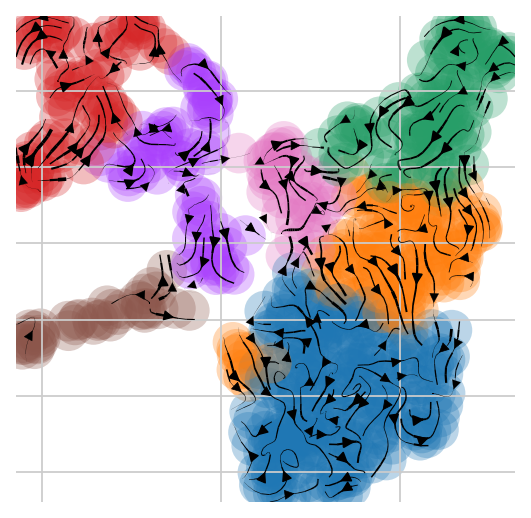

In [134]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


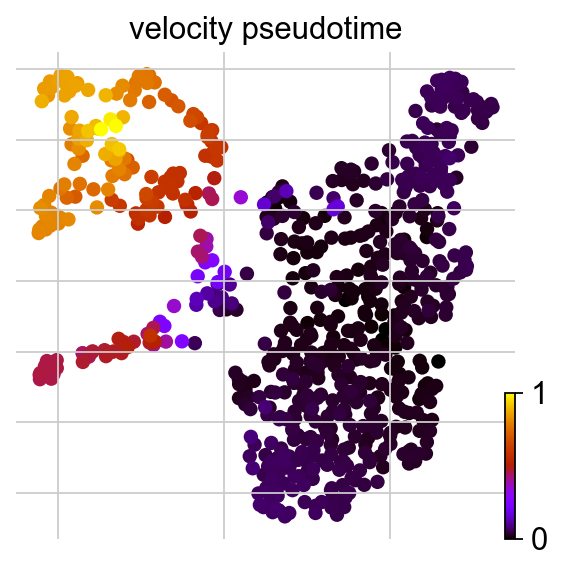

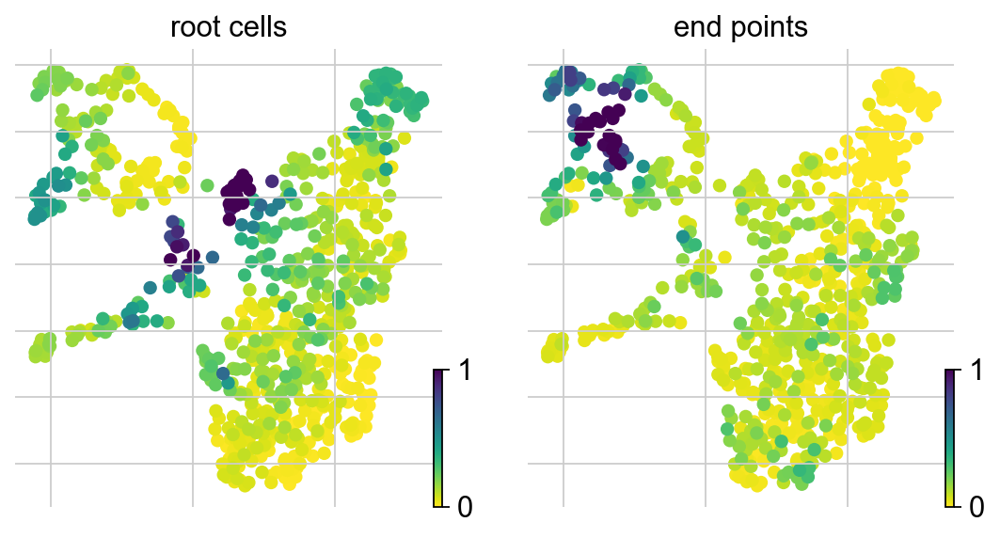

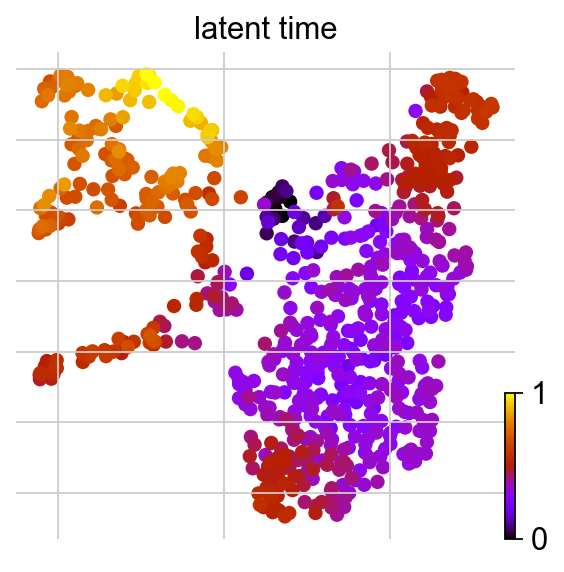

In [135]:
###### for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=10, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo__stream_umap_1.svg


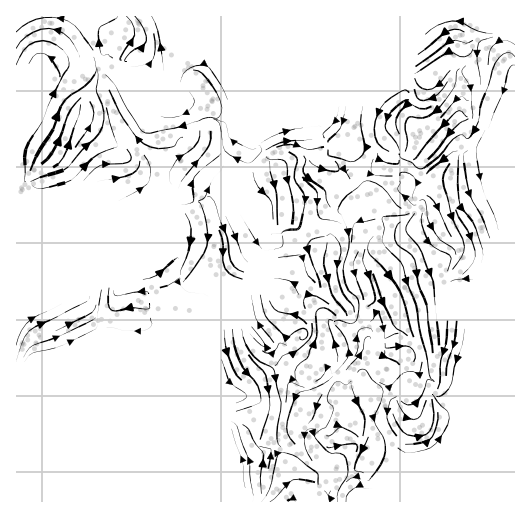

In [136]:
# n =10 
scv.pl.velocity_embedding_stream(adata, density=2, min_mass=0 
                                 ,cutoff_perc=0,arrow_size=0.75, 
                                 basis='umap',frameon=False ,legend_loc='right margin', 
                                 size=20, save='_stream_umap_1.svg')

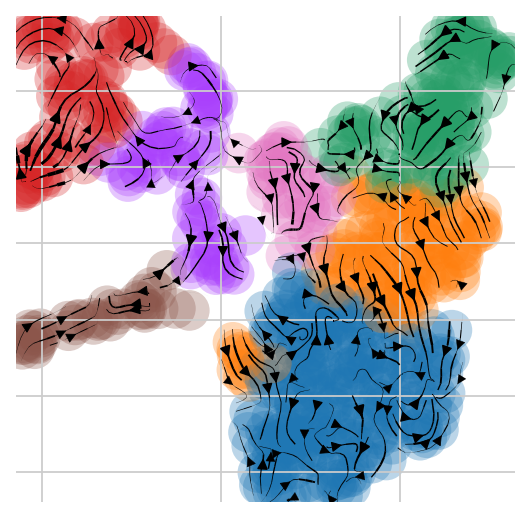

In [137]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [138]:
##n_neighbors=10 test ###This was the best
## n_pcs increased to make more clusters =50

scv.pp.moments(adata, n_pcs=50, n_neighbors=20)
adata

computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'velo

computing velocity graph (using 1/16 cores)


  0%|          | 0/717 [00:00<?, ?cells/s]

    finished (0:00:00) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


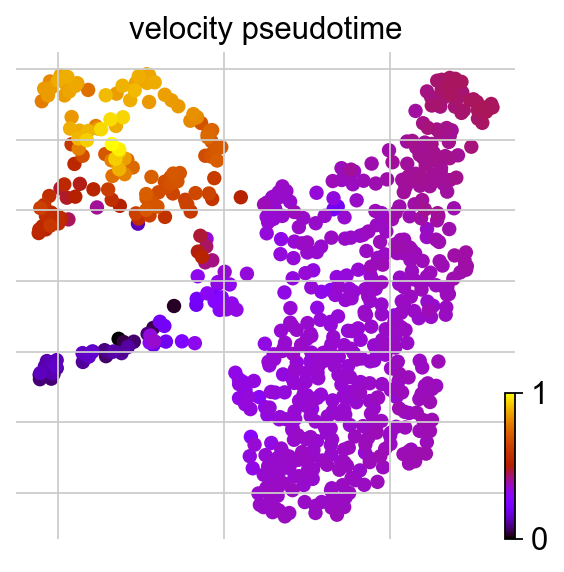

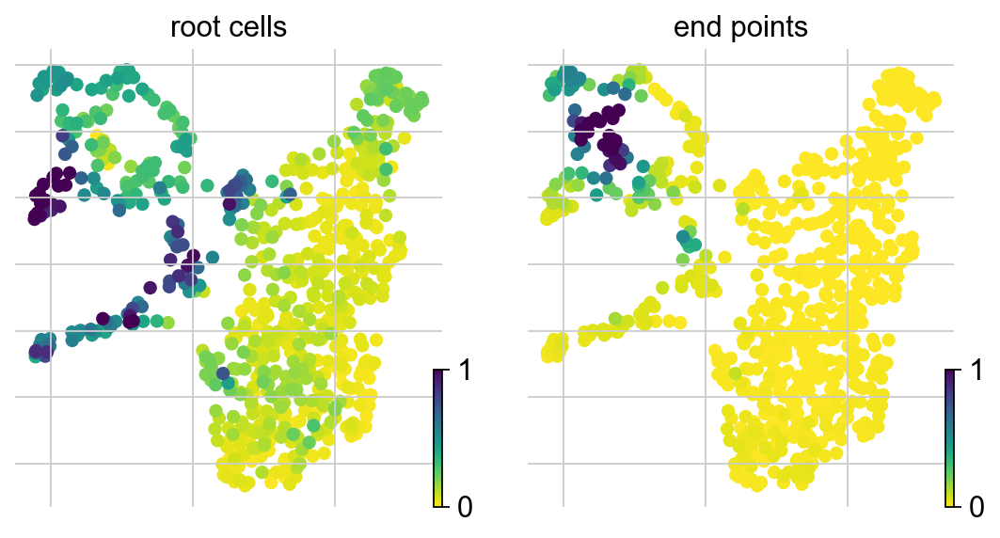

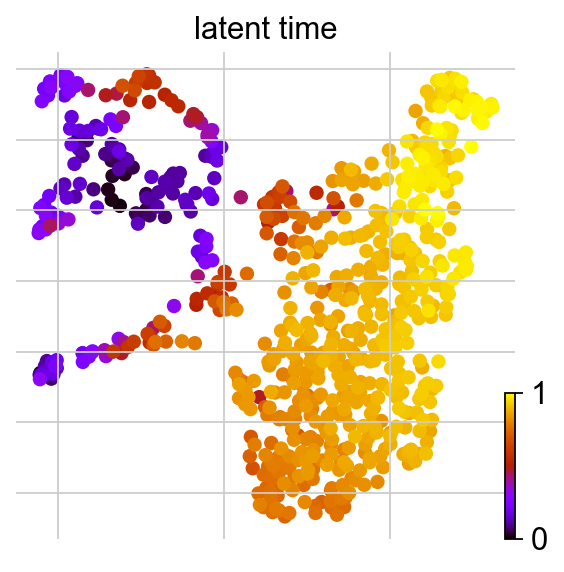

In [139]:
## for the latent_time Umap ############
##### mode_neighbors can be removed#########
##### save the plots after comparison######

scv.tl.velocity_graph(adata,n_neighbors=20, mode_neighbors='connectivities')
scv.tl.terminal_states(adata)
scv.tl.latent_time(adata)

scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')
scv.pl.scatter(adata, color=['root_cells', 'end_points'])
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


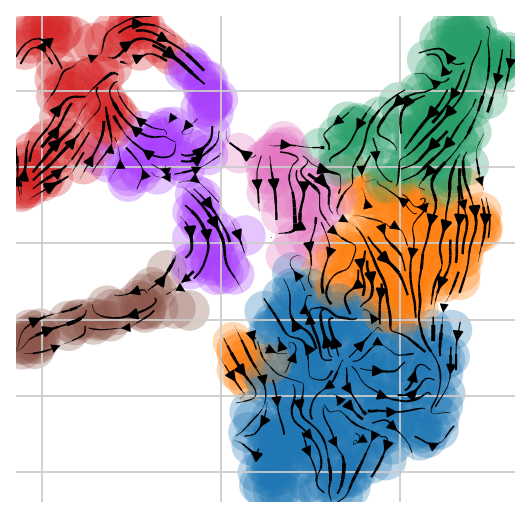

In [140]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['leiden'], legend_loc='none', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

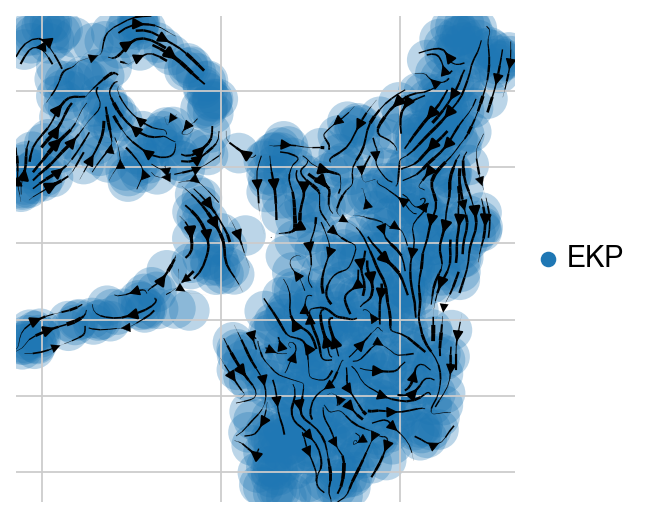

In [141]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color=['type'], legend_loc='right margin', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [142]:
adata.write('scvelo_EKP_2nd_try.h5ad', compression='gzip')

In [143]:
adata = sc.read('scvelo_EKP_2nd_try.h5ad')

# Check

In [145]:
scv.tl.rank_velocity_genes(adata, groupby='leiden', min_corr=0.4)
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6
0,Zfp52,Arg1,Gm15987,Mast4,Wsb1,Rps10,Kynu
1,Klf3,Spred2,Il21r,Magi1,Hdac7,Mt1,Ccl6
2,F13a1,App,Tmem51,Mecom,Mast4,Myo1g,Gpr171
3,Adgrl2,Trim25,Iqgap1,Rnasel,Hexb,Malat1,Il1r2
4,Pdpn,Malat1,Paf1,Anapc13,Gtf2i,Trim24,Arg1
...,...,...,...,...,...,...,...
82,Malat1,Tbc1d14,Gpr183,Hivep3,Hivep3,Dab2,Irf4
83,Arg1,Nr4a3,Klf3,App,Bcl3,Pde4b,Pdpn
84,Wsb1,Sptbn1,Clec4a3,Hif1a,Dab2,Fem1c,P2ry14
85,Ppp1r3b,Irf4,F13a1,Map4k4,Thbs1,Hif1a,Il21r


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


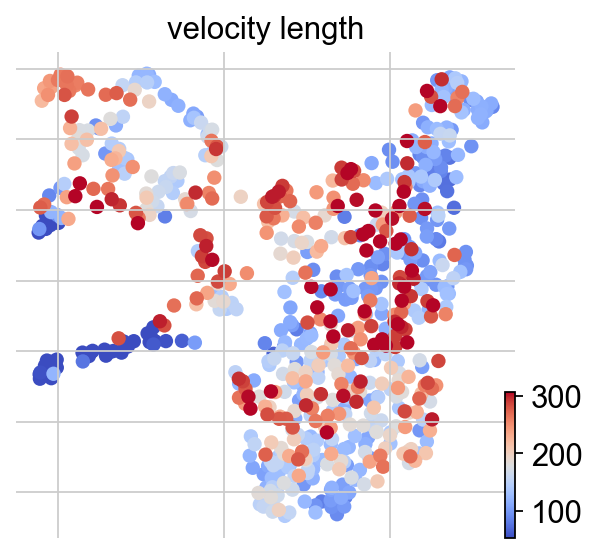

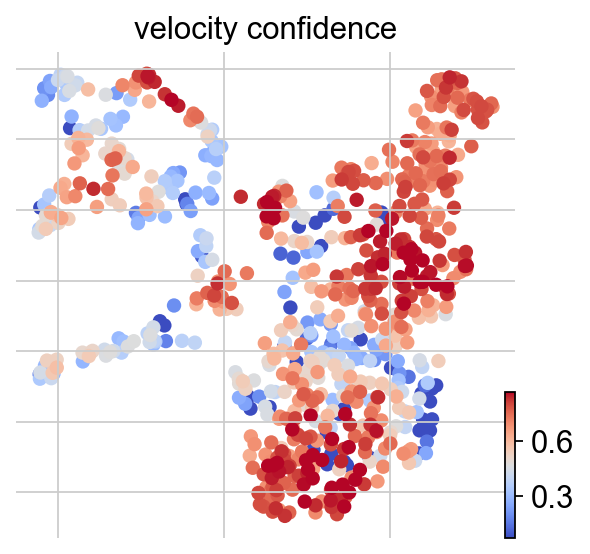

In [146]:
scv.tl.velocity_confidence(adata)
scv.pl.scatter(adata, c=['velocity_length'], cmap='coolwarm', perc=[5, 95], use_raw=False)
scv.pl.scatter(adata, c=['velocity_confidence'], cmap='coolwarm', perc=[5, 95], use_raw=False)

In [147]:
df = adata.obs.groupby('leiden')['velocity_length', 'velocity_confidence'].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

leiden,0,1,2,3,4,5,6
velocity_length,172.973878,193.893171,160.840776,180.652857,203.004722,65.011463,224.171667
velocity_confidence,0.557687,0.691374,0.709945,0.528411,0.445165,0.382191,0.540001


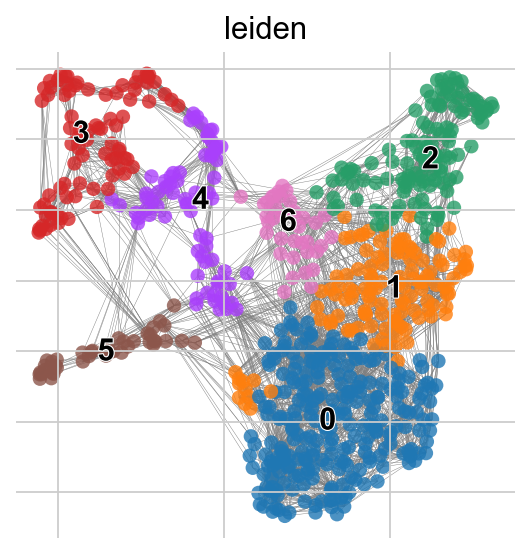

In [148]:
scv.pl.velocity_graph(adata, color=['leiden'], threshold=0.1)

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)
saving figure to file ./figures/scvelo_scatter_scvelo_EKP_latent_time.pdf


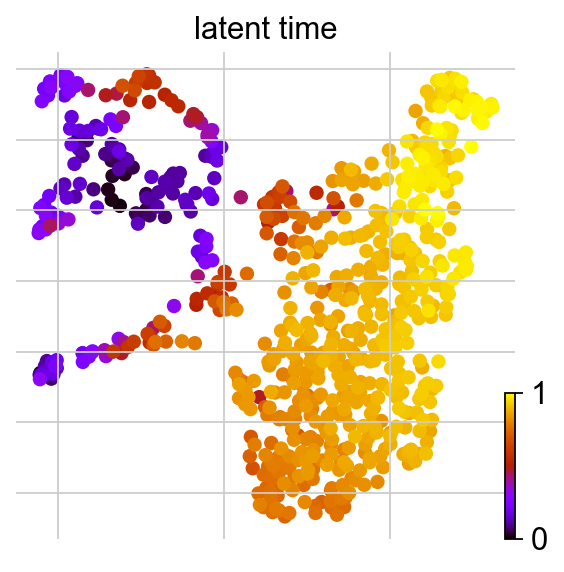

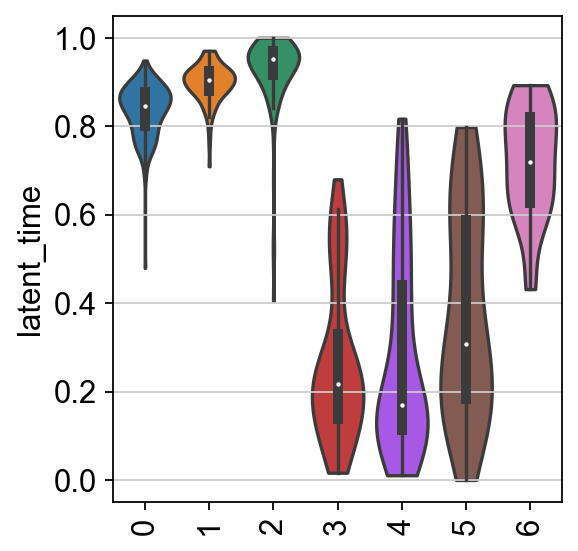

In [182]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', use_raw=False, frameon=False, save='scatter_scvelo_EKP_latent_time.pdf')
sc.pl.violin(adata, keys=["latent_time"], groupby="leiden", use_raw=False, stripplot=False, rotation=90, save="violin_EKP_scvelo_latent_time.pdf", inner='box')
adata.obs.to_csv('scvelo_adata_obs.csv')

In [149]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

running PAGA using priors: ['latent_time']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo_paga_EKP_scvelo.pdf


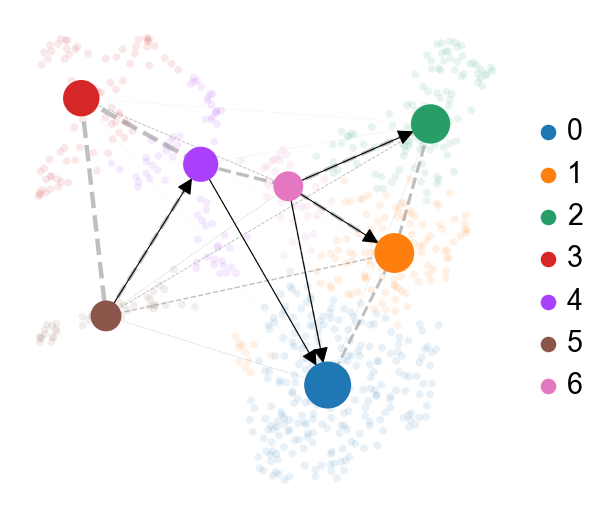

In [181]:
scv.tl.paga(adata, groups='leiden', vkey='velocity', use_time_prior="latent_time")
scv.pl.paga(adata, basis='umap', vkey='velocity', color='leiden', title='', size=50, alpha=0.1, min_edge_width=0.5, node_size_scale=1.5, use_raw=False, save='paga_EKP_scvelo.pdf')

saving figure to file ./figures/scvelo_heatmap__scvelo_EKP_heatmap.pdf


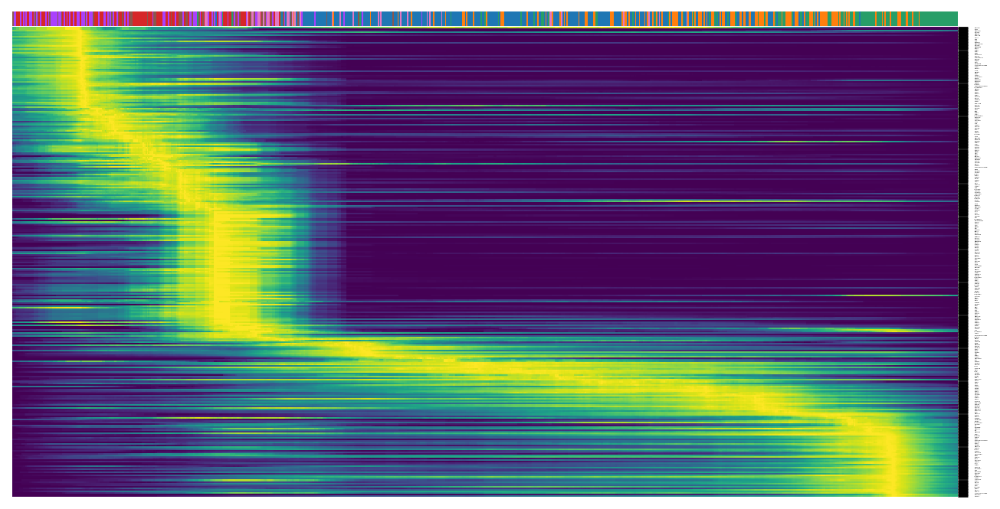

In [151]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='leiden', n_convolve=100, yticklabels=True, font_scale=0.1, save='_scvelo_EKP_heatmap.pdf')

In [152]:
adata.write('scvelo_EKP_2nd_try_final_integrated.h5ad')

In [5]:
adata= sc.read('scvelo_EKP_2nd_try_final_integrated.h5ad')
adata

AnnData object with n_obs × n_vars = 717 × 2000
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'type', 'leiden', 'batch', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'gene_ids_2', 'feature_types_2', 'mt_2', 'n_cells_2-0', 'n_cells_by_counts_2-0', 'mean_counts_2-0', 'pct_dropout_by_counts_2-0', 'total_counts_2-0', 'n_cells_2-1', 'n_cells_by_counts_2-1', 'mean_counts_2-1', 'pct_dropout_by_counts_2-1', 'total_counts_2-1', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_r2', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'f

# Check

# overwrite scvelo info to processed file

In [9]:
# scanpy-based processed file: 2_EKP_RKP_epithelial_cell_with_more_genes_04-30-24
processed = sc.read('Epi_after_harmony_more_genes_04-30-24.h5ad')
processed

AnnData object with n_obs × n_vars = 1832 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EKP_RKP_Tumor_rank_fgsea', 'Leiden_Tumor_rank_fgsea', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

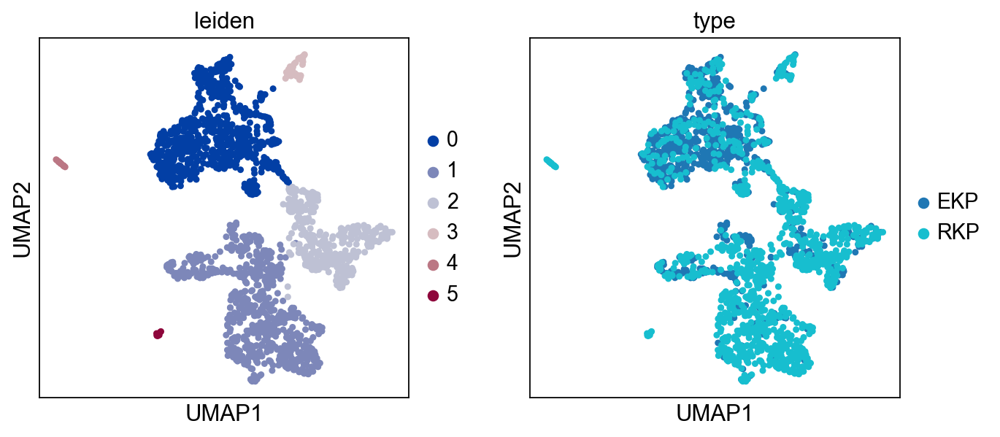

In [10]:
sc.pl.umap(processed, color=['leiden','type'])

In [11]:
processed = processed[processed.obs['type']=='EKP']
processed

View of AnnData object with n_obs × n_vars = 717 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EKP_RKP_Tumor_rank_fgsea', 'Leiden_Tumor_rank_fgsea', 'leiden', 'log1p', 'neighbors', 'pca', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

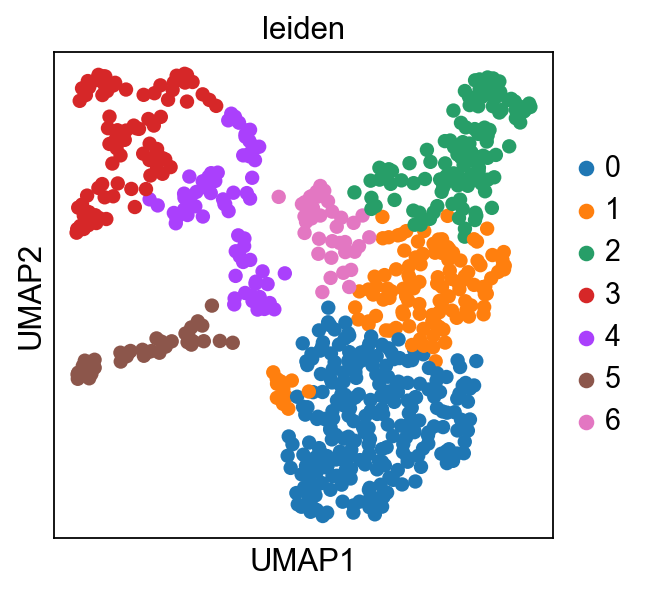

In [12]:
sc.pl.umap(adata, color=['leiden'])

In [13]:
processed.obs['scvelo_leiden'] = adata.obs['leiden']
processed.obs['velocity_length'] = adata.obs['velocity_length']

processed.uns['scvelo_umap'] = adata.uns['umap']

processed.obsm['velocity_umap'] = adata.obsm['velocity_umap']
processed.obsm['X_scvelo_umap'] = adata.obsm['X_umap']

#processed.layers['velocity'] = adata.layers['velocity']


In [14]:
adata.uns['scanpy_umap'] = processed.uns['umap']
adata.obsm['X_scanpy_umap'] = processed.obsm['X_umap']

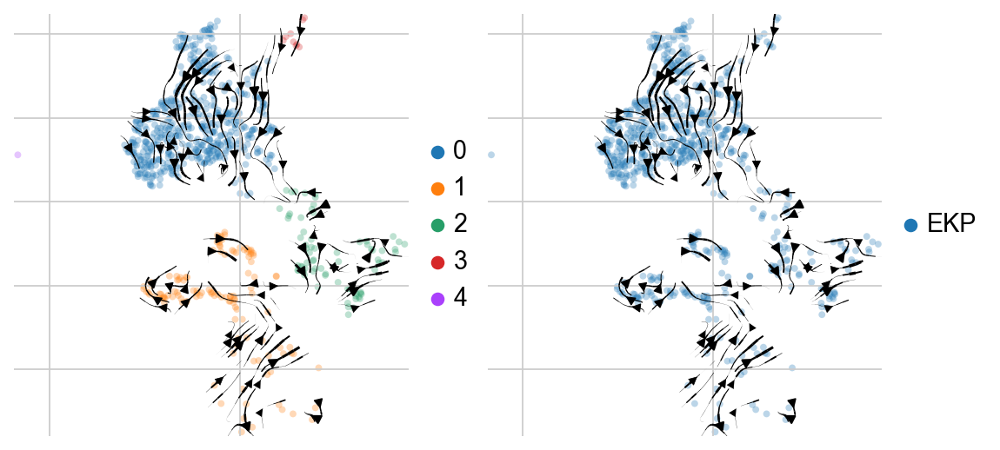

In [15]:
scv.pl.velocity_embedding_stream(processed, basis='umap', color=['leiden','type'],size=50, legend_loc='right margin', title='', use_raw=False, frameon=False)#, save='type1_from_2nd_try.pdf')

In [16]:
sub_pro = processed

In [17]:
sub_pro

AnnData object with n_obs × n_vars = 717 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'scvelo_leiden', 'velocity_length'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EKP_RKP_Tumor_rank_fgsea', 'Leiden_Tumor_rank_fgsea', 'leiden', 'log1p', 'neighbors', 'pca', 'tissue_colors', 'type_colors', 'umap', 'scvelo_umap', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'velocity_umap', 'X_scvelo_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [23]:
sub_pro.uns['umap'] =sub_pro.uns['scvelo_umap']
sub_pro.obsm['X_umap'] =sub_pro.obsm['X_scvelo_umap']


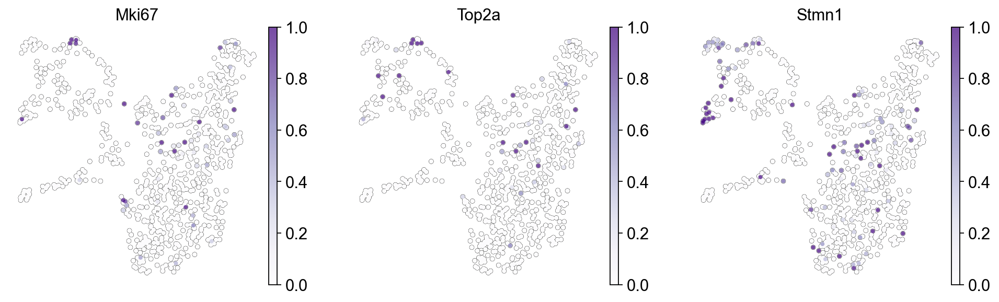

In [20]:
sc.pl.umap(sub_pro, color=['Mki67','Top2a','Stmn1'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples', vmax=[1,1,1],save='_Prolif_in_EKP_072524.pdf')

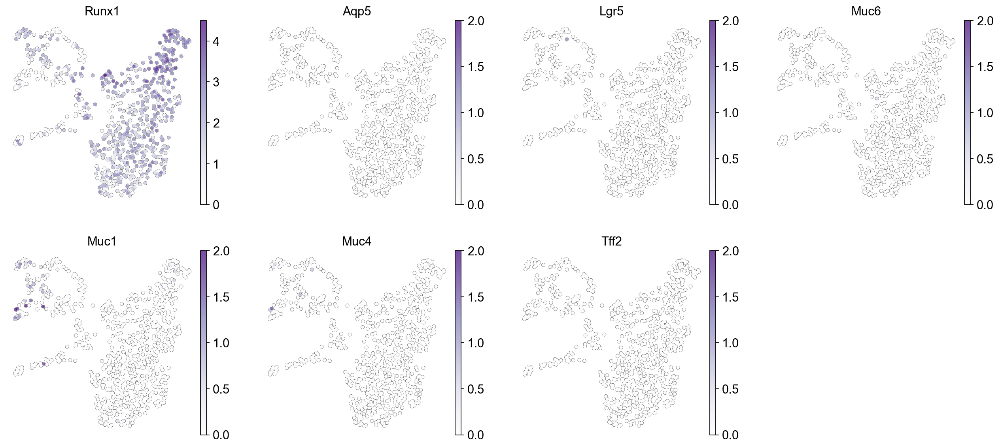

In [18]:
sc.pl.umap(sub_pro, color=['Runx1','Aqp5','Lgr5','Muc6','Muc1','Muc4','Tff2'], legend_loc='right margin', frameon=False, add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples', vmax=[4.5, 2, 2, 2, 2,2,2],save='_markers_in_EKP_072524.pdf')

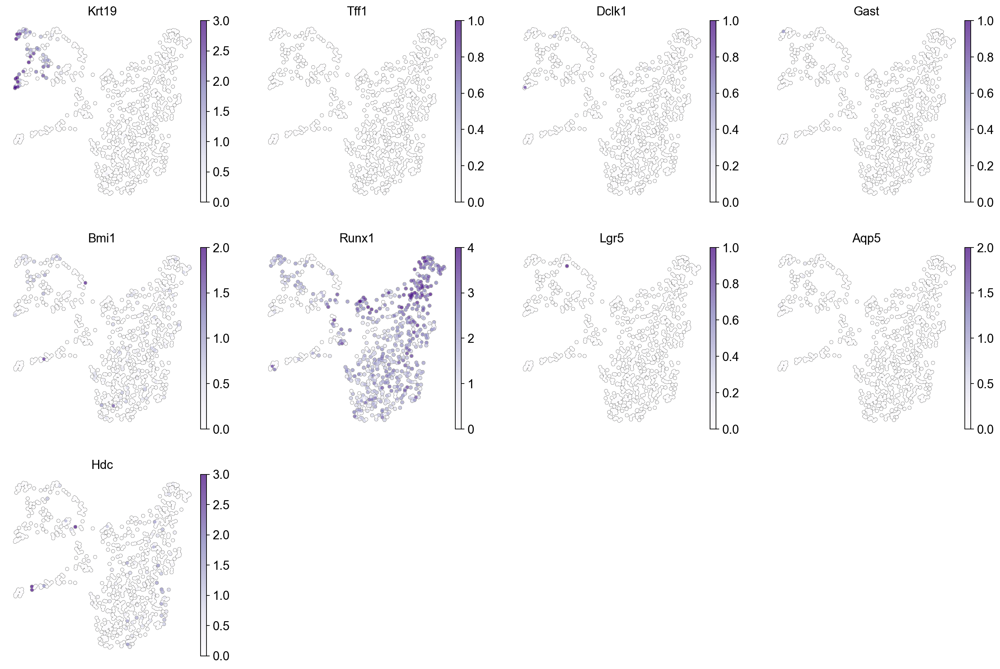

In [23]:
sc.pl.umap(sub_pro, color=['Krt19','Tff1',#'Muc5ac',[pit cell]
                           'Dclk1','Gast',#'SSt',[Tuft and G cell]
                           'Bmi1','Runx1',#'Mist1', [stem cell]
                          'Lgr5','Aqp5', #[Basal stem cell]
                           'Hdc'#'Cckbr',[ECL cell]
                          ], legend_loc='right margin', frameon=False, vmax=[3,1,1,1,2,4,1,2,3],
           add_outline=True, outline_width=(0.05,0.05), size=50, cmap='Purples',save='_markers_2_in_EKP_072524.pdf')

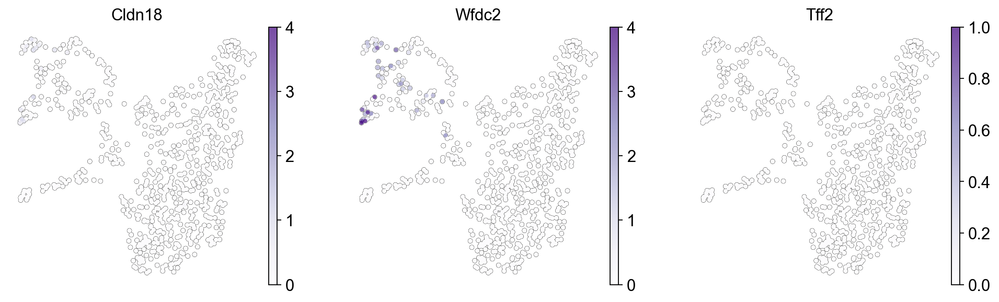

In [16]:
sc.pl.umap(sub_pro, color=['Cldn18','Wfdc2','Tff2'
                          ], legend_loc='right margin', frameon=False, add_outline=True, vmax=[4,4,1],
           outline_width=(0.05,0.05), size=50, cmap='Purples',save='_SRCC_markers_in_EKP_on_scvelo_umap.pdf')

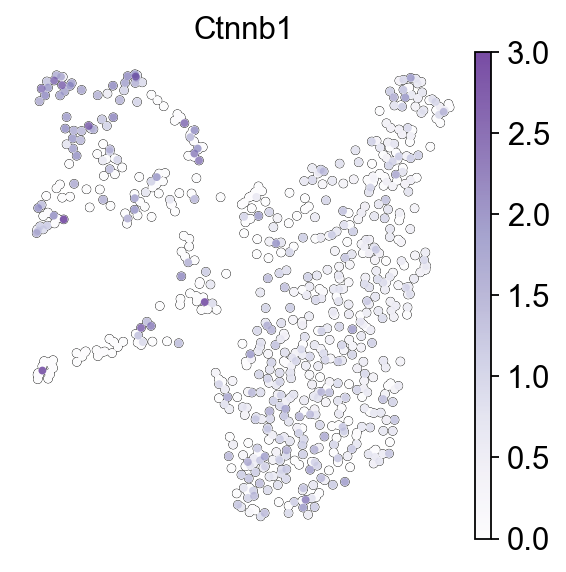

In [19]:
sc.pl.umap(sub_pro, color=['Ctnnb1'
                          ], legend_loc='right margin', frameon=False, add_outline=True, vmax=[3],
           outline_width=(0.05,0.05), size=50, cmap='Purples',save='_Ctnnb1_in_EKP_on_scvelo_umap.pdf')

saving figure to file ./figures/scvelo__in_EKP_by_scvelo-leiden_scanpy-leiden.png


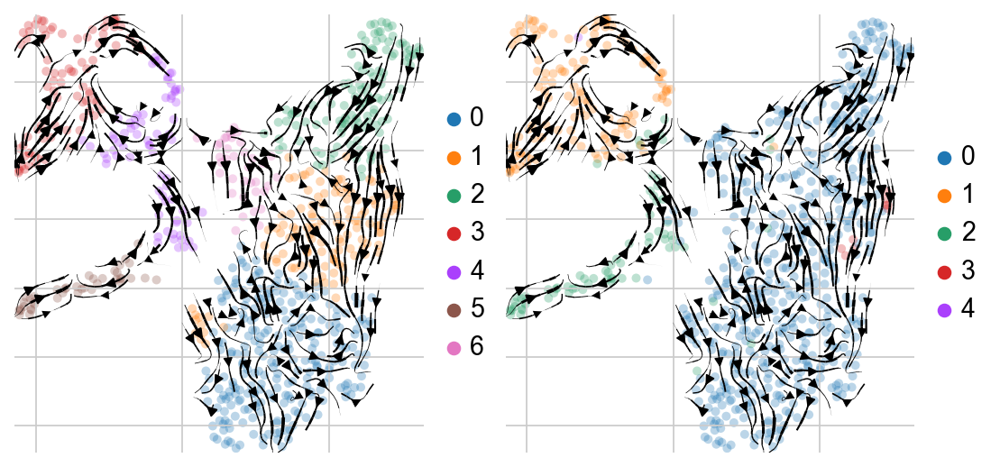

In [24]:
scv.pl.velocity_embedding_stream(sub_pro, basis='umap', color=['scvelo_leiden','leiden'],size=80, legend_loc='right margin', title='', use_raw=False, frameon=False,  save='_in_EKP_by_scvelo-leiden_scanpy-leiden.png')

In [169]:
sub_pro.uns['log1p']["base"] = None

In [170]:
#for fGSEA
sc.tl.rank_genes_groups(sub_pro, groupby='scvelo_leiden', method='wilcoxon', use_raw=True,  key_added = "scvelo_leiden_rank")
result = sub_pro.uns['scvelo_leiden_rank']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:5]: result[key][group]
    for group in groups for key in ['names', 'scores','logfoldchanges', 'pvals', 'pvals_adj']}).to_csv("D:/KP/EKP_RKP/EKP_scvelo_leiden_DEG.csv")
# logFC becomes negative or disappear when use_raw=False, could be Scanpy bug


ranking genes
    finished: added to `.uns['scvelo_leiden_rank']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_scvelo_leiden']`


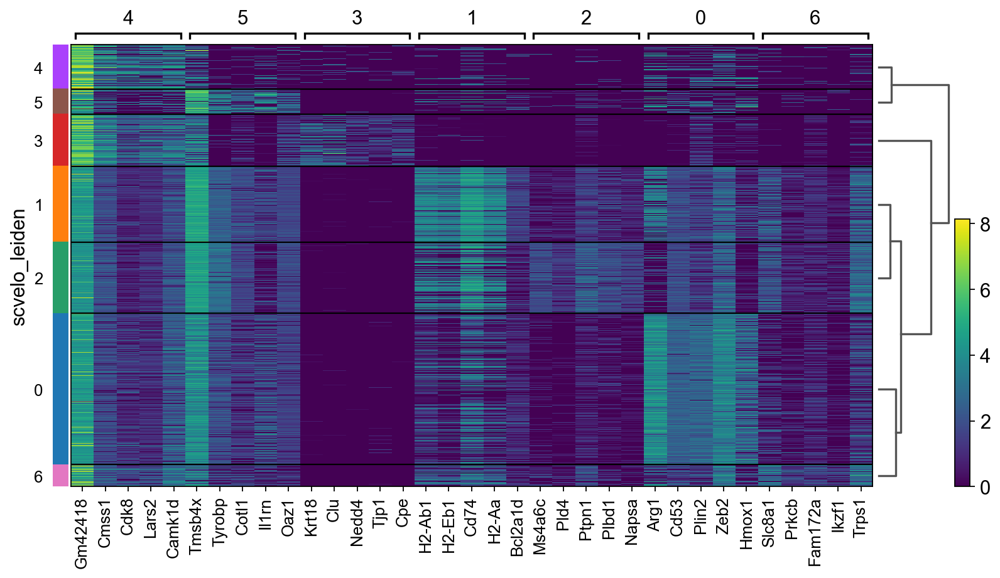

In [171]:
sc.pl.rank_genes_groups_heatmap(sub_pro, show_gene_labels=True, key="scvelo_leiden_rank",n_genes=5)#, save='_tumor_by_leiden.pdf')

In [25]:
sub_pro.obs

,batch,sample_batch,tissue,type,leiden,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rpl,pct_counts_rpl,total_counts_rps,pct_counts_rps,scvelo_leiden,velocity_length
AAACCCACAGTATGAA,0,-1-0,allograft,EKP,0,3835,3835,16059.0,1046.0,6.513482,0.0,0.0,0.0,0.0,0,167.25
AAACGAAAGTAGGGTC,0,-1-0,allograft,EKP,2,338,338,1239.0,1.0,0.080710,0.0,0.0,0.0,0.0,5,33.70
AAACGAATCTCGCTTG,0,-1-0,allograft,EKP,2,656,656,1903.0,570.0,29.952705,0.0,0.0,0.0,0.0,4,290.87
AAACGCTAGTGGCGAT,0,-1-0,allograft,EKP,0,4898,4898,26809.0,977.0,3.644298,0.0,0.0,0.0,0.0,1,109.88
AAACGCTCATGGAATA,0,-1-0,allograft,EKP,0,4000,4000,21023.0,548.0,2.606669,0.0,0.0,0.0,0.0,2,100.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTAGTCTCAGGCGAA,0,-1-0,allograft,EKP,0,4392,4392,27175.0,842.0,3.098436,0.0,0.0,0.0,0.0,1,307.28
TTTCACAAGAGTCTTC,0,-1-0,allograft,EKP,0,4679,4679,38172.0,845.0,2.213665,0.0,0.0,0.0,0.0,0,159.35
TTTCATGCATCCGAAT,0,-1-0,allograft,EKP,1,564,564,1562.0,155.0,9.923176,0.0,0.0,0.0,0.0,3,57.19
TTTGACTAGGTCGACA,0,-1-0,allograft,EKP,0,3165,3165,15054.0,348.0,2.311678,0.0,0.0,0.0,0.0,0,125.57


In [19]:
sub_pro.obs['scvelo_leiden']

AAACCCACAGTATGAA    0
AAACGAAAGTAGGGTC    5
AAACGAATCTCGCTTG    4
AAACGCTAGTGGCGAT    1
AAACGCTCATGGAATA    2
                   ..
TTTAGTCTCAGGCGAA    1
TTTCACAAGAGTCTTC    0
TTTCATGCATCCGAAT    3
TTTGACTAGGTCGACA    0
TTTGGAGGTACAGTAA    0
Name: scvelo_leiden, Length: 717, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

saving figure to file ./figures/scvelo__in_EKP_by_scvelo-leiden_scanpy-leiden.png


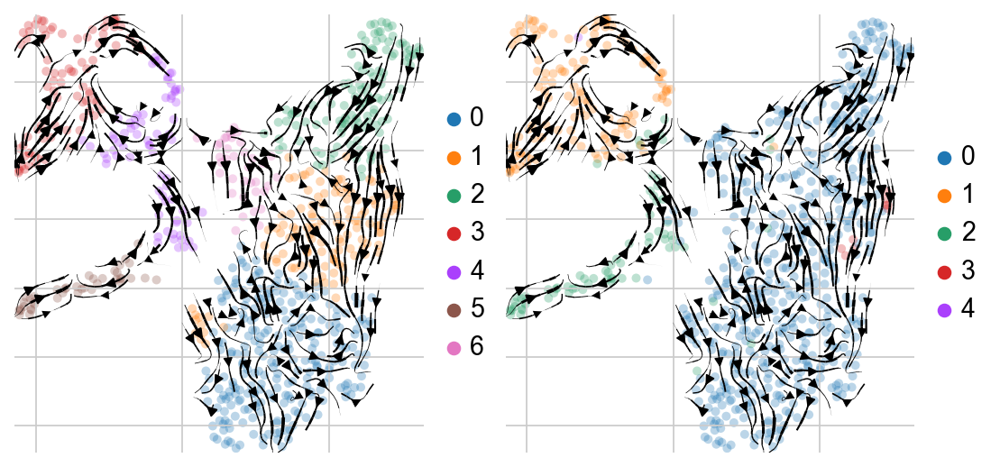

In [24]:
scv.pl.velocity_embedding_stream(sub_pro, basis='umap', color=['scvelo_leiden','leiden'],size=80, legend_loc='right margin', title='', use_raw=False, frameon=False)#,  save='_in_EKP_by_scvelo-leiden_scanpy-leiden.png')

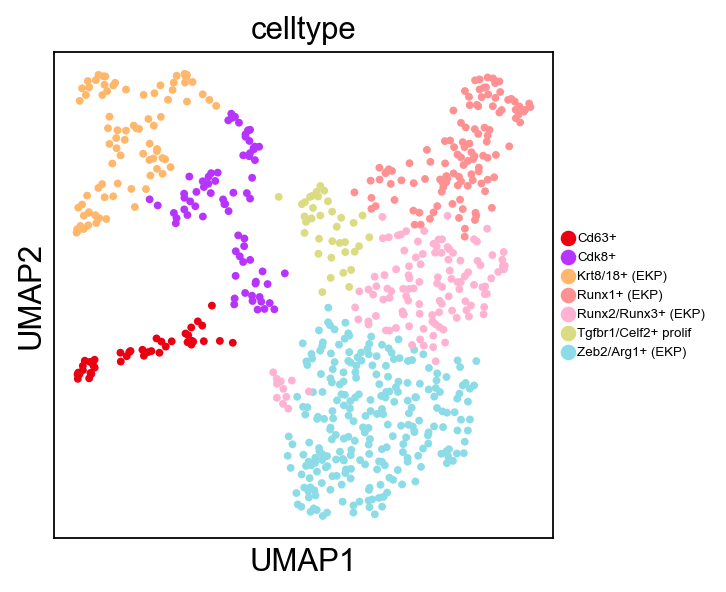

In [61]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Runx1+ (EKP)':['2'],
             'Krt8/18+ (EKP)': ['3'],
             'Tgfbr1/Celf2+ prolif':['6'],
             'Zeb2/Arg1+ (EKP)': ['0' ],
             'Cd63+': ['5'],
             'Cdk8+': ['4'],
             'Runx2/Runx3+ (EKP)': ['1'],
            }

# Initialize empty column in cell metadata
sub_pro.obs['celltype'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(sub_pro.obs.scvelo_leiden).isin(cell_dict[i])
    sub_pro.obs.loc[ind,'celltype'] = i

sc.pl.umap(sub_pro, color=['celltype'], legend_loc='right margin', size=50, legend_fontsize=6, save='_EKP_by_celltype.pdf')


saving figure to file ./figures/scvelo__in_EKP_by_celltype.png


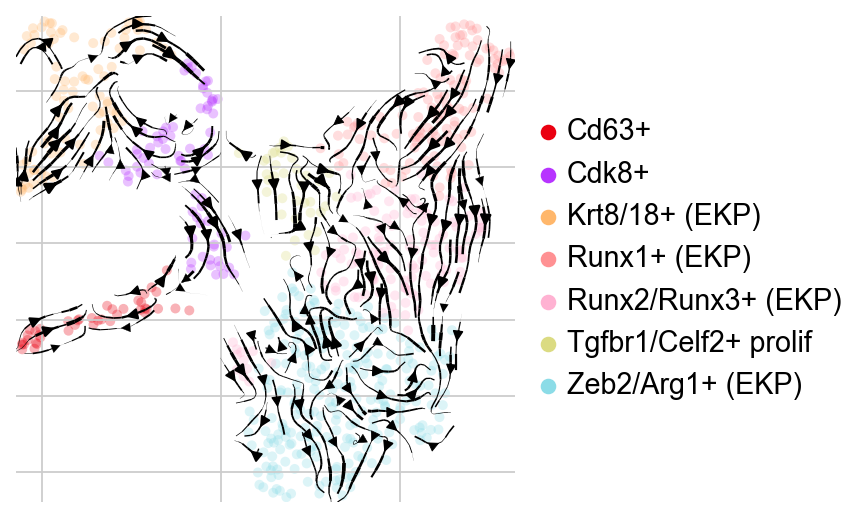

In [62]:
scv.pl.velocity_embedding_stream(sub_pro, basis='umap', color=['celltype'],size=80, legend_loc='right margin', title='', use_raw=False, frameon=False,  save='_in_EKP_by_celltype.png')

saving figure to file ./figures/scvelo__in_EKP_by_celltype_color_changed.png


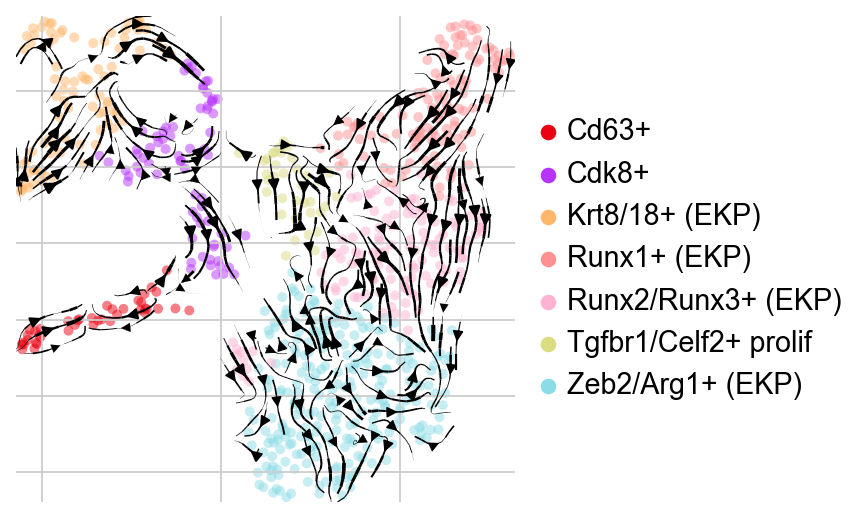

In [63]:
scv.pl.velocity_embedding_stream(sub_pro, basis='umap', color=['celltype'],palette=["#ea0011", "#b734ff","#ffb76b","#ff9193",
                                                                                    "#ffb2d2","#dbdb82","#8cdce7"],
                                 size=80, legend_loc='right margin',alpha=0.5, title='', use_raw=False, frameon=False,  save='_in_EKP_by_celltype_color_changed.png')

In [64]:
sub_pro.write('processed_with_scvelo_info_EKP.h5ad', compression='gzip')

In [65]:
sub_pro = sc.read('processed_with_scvelo_info_EKP.h5ad')
sub_pro

AnnData object with n_obs × n_vars = 717 × 20470
    obs: 'batch', 'sample_batch', 'tissue', 'type', 'leiden', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rpl', 'pct_counts_rpl', 'total_counts_rps', 'pct_counts_rps', 'scvelo_leiden', 'velocity_length', 'celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'rpl', 'rps', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'EKP_RKP_Tumor_rank_fgsea', 'Leiden_Tumor_rank_fgsea', 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'scvelo_umap', 'tissue_colors', 'type_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_scvelo_umap', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

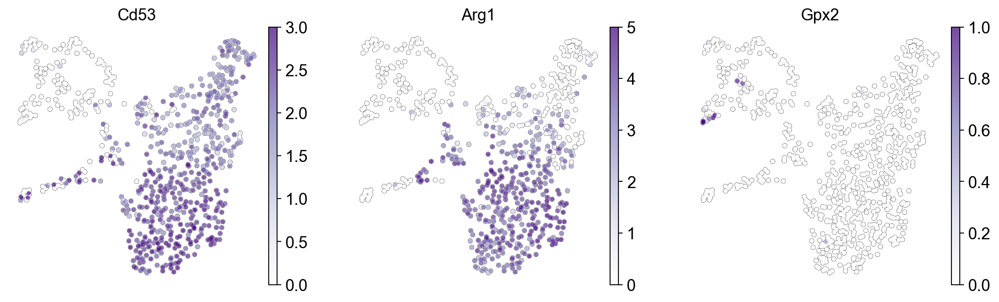

In [66]:
sc.pl.umap(sub_pro, color=['Cd53','Arg1',
                            'Gpx2'
                          ], legend_loc='right margin', frameon=False,
           add_outline=True, outline_width=(0.05,0.05), vmax=[3,5,1], size=50, cmap='Purples',save='_Cd53,Arg1,Gpx2_in_EKP_081924.pdf')

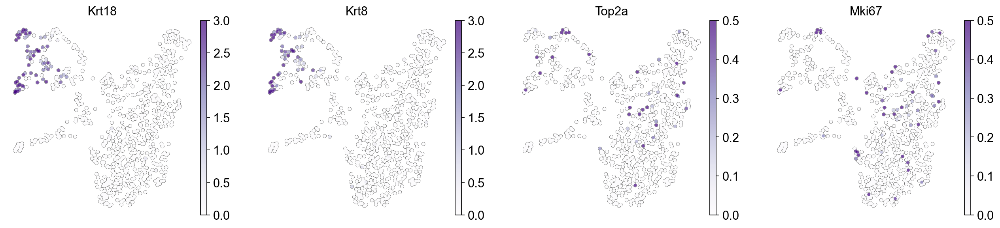

In [67]:
sc.pl.umap(sub_pro, color=['Krt18','Krt8','Top2a','Mki67'
                          ], legend_loc='right margin', frameon=False,
           add_outline=True, outline_width=(0.05,0.05),vmax=[3,3,0.5,0.5], size=50, cmap='Purples',save='_Krt18,Krt8,Top2a,Mki67_in_EKP_081924.pdf')

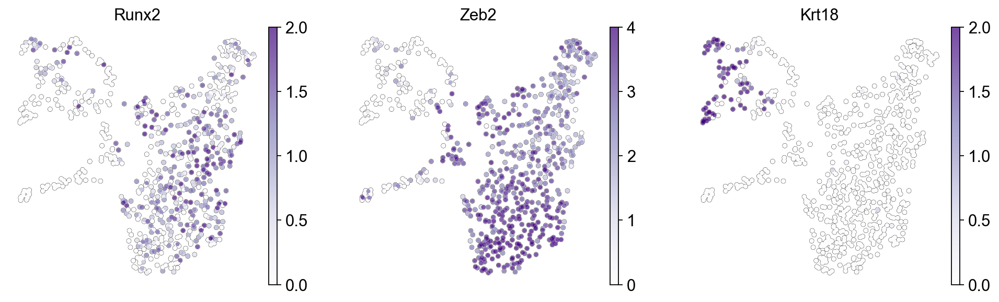

In [68]:
sc.pl.umap(sub_pro, color=['Runx2','Zeb2','Krt18'
                          ], legend_loc='right margin', frameon=False,
           add_outline=True, outline_width=(0.05,0.05),vmax=[2,4,2], size=50, cmap='Purples')#,save='_Krt18,Krt8,Top2a,Mki67_in_RKP_081924.pdf')